# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0k/60.0k [00:08<00:00, 6.78kFile/s]


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

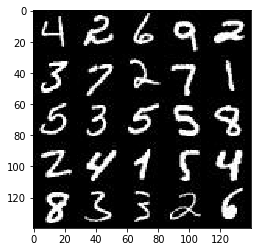

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

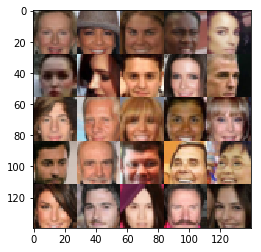

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.11.0
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # Implement Function
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, (None), name='learning_rate')

    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False, alpha=0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer from celeba is 28x28x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        lrelu1 = tf.maximum(alpha * x1, x1)
        # now 14x14x64
        x2 = tf.layers.conv2d(lrelu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        lrelu2 = tf.maximum(alpha * bn2, bn2)
        # now 7x7x128
        x3 = tf.layers.conv2d(lrelu2, 265, 5, strides=1, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        lrelu3 = tf.maximum(alpha * bn3, bn3)
        # now 7x7x265
        x4 = tf.layers.conv2d(lrelu3, 512, 5, strides=1, padding='same')
        bn4 = tf.layers.batch_normalization(x4, training=True)
        lrelu4 = tf.maximum(alpha * bn4, bn4)
        # now 7x7x512
                
        flat = tf.reshape(lrelu4, (-1, 7*7*512))
        
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    reuse = True
    if(is_train):
        reuse=False
    
    # Implement Function
    with tf.variable_scope('generator', reuse=reuse):
        # Fully connected layer
        x1 = tf.layers.dense(z, 7*7*512)
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        bn1 = tf.layers.batch_normalization(x1, training=is_train)
        lrelu1 = tf.maximum(alpha * bn1, bn1)
        # now 7x7x512
        
        # Convolutional layers
        x2 = tf.layers.conv2d_transpose(lrelu1, 256, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=is_train)
        lrelu2 = tf.maximum(alpha * bn2, bn2)
        #now 14x14x265
        
        x3 = tf.layers.conv2d_transpose(lrelu2, 128, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=is_train)
        lrelu3 = tf.maximum(alpha * bn3, bn3)
        #now 28x28x128
        
        x4 = tf.layers.conv2d_transpose(lrelu3, 64, 5, strides=1, padding='same')
        bn4 = tf.layers.batch_normalization(x4, training=is_train)
        lrelu4 = tf.maximum(alpha * bn4, bn4)
        #now 28x28x64
        
        logits = tf.layers.conv2d_transpose(lrelu4, out_channel_dim, 5, strides=1, padding='same')
        # 28x28xout_channel_dim
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
  File "/home/ubuntu/anaconda3/lib/python3.6/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)  File "/home/ubuntu/anaconda3/lib/python3.6/runpy.py", line 85, in _run_code
    exec(code, run_globals)  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 486, in start
    self.io_loop.start()  File "/home/ubuntu/anaconda3/lib/python3.6/site-packages/tornado/platform/asyncio.py", line 127, 

### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # For label smoothing for the discriminator
    smooth = 0.01
    
    # Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels = tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels = tf.zeros_like(d_model_fake) * (1 - smooth)))
    
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels = tf.ones_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Implement Function
    t_vars = tf.trainable_variables()
    
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    # From dcgan-svhn
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [12]:
# Adapted from https://github.com/udacity/deep-learning-udacity-material/blob/master/dcgan-svhn/DCGAN_Exercises.ipynb
def scale(x):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))

    x = x * (1 - -1) + (-1)
    return x

In [13]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """    
    # Build Model
    sample_z = np.random.uniform(-1, 1, size=(72, z_dim)) # For sampling
    steps = 0
    
    # print(data_shape) with MNIST: (60000, 28, 28, 1)
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
        
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                batch_images = scale(batch_images)
                steps += 1
                #print(batch_images.shape) # MNIST: 128, 28, 28, 1
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim)) # Get random noise
                
                # Optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                
                # Printing losses - from dcgan-svhn
                if steps % 50 == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images, lr: learning_rate})
                    train_loss_g = g_loss.eval({input_z: batch_z, lr: learning_rate})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Steps {}".format(steps),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
                    # Showing examples
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)    

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Steps 50 Discriminator Loss: 0.0011... Generator Loss: 7.1469


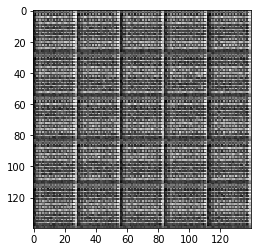

Epoch 1/2... Steps 100 Discriminator Loss: 2.0549... Generator Loss: 0.1600


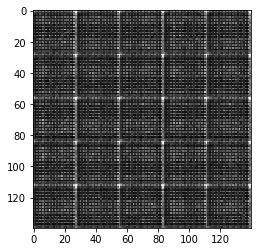

Epoch 1/2... Steps 150 Discriminator Loss: 1.6975... Generator Loss: 0.2707


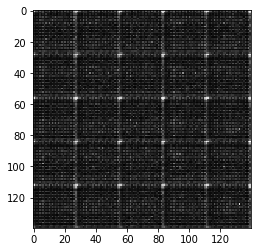

Epoch 1/2... Steps 200 Discriminator Loss: 1.6307... Generator Loss: 0.3060


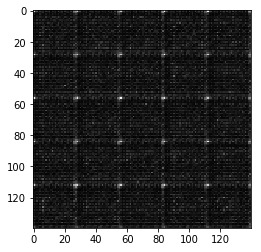

Epoch 1/2... Steps 250 Discriminator Loss: 1.6054... Generator Loss: 0.3220


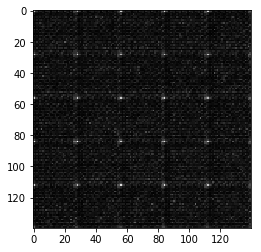

Epoch 1/2... Steps 300 Discriminator Loss: 1.5783... Generator Loss: 0.3411


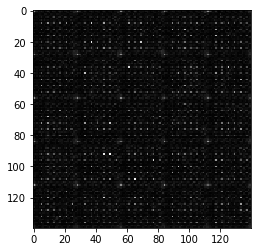

Epoch 1/2... Steps 350 Discriminator Loss: 1.5605... Generator Loss: 0.3539


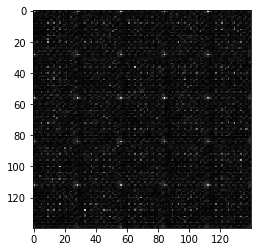

Epoch 1/2... Steps 400 Discriminator Loss: 1.5445... Generator Loss: 0.3666


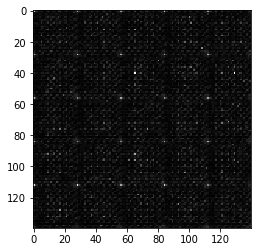

Epoch 1/2... Steps 450 Discriminator Loss: 1.5417... Generator Loss: 0.3690


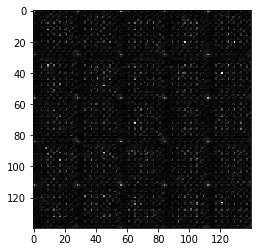

Epoch 1/2... Steps 500 Discriminator Loss: 1.5426... Generator Loss: 0.3689


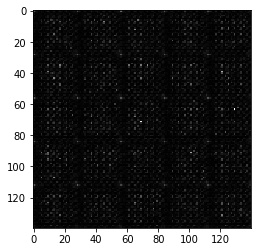

Epoch 1/2... Steps 550 Discriminator Loss: 1.5280... Generator Loss: 0.3808


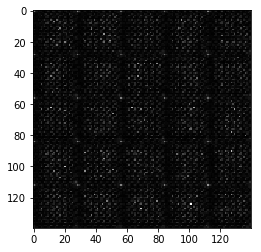

Epoch 1/2... Steps 600 Discriminator Loss: 1.5212... Generator Loss: 0.3871


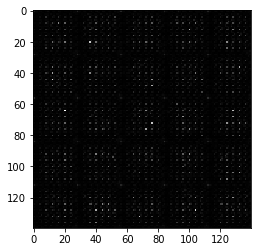

Epoch 1/2... Steps 650 Discriminator Loss: 1.5223... Generator Loss: 0.3861


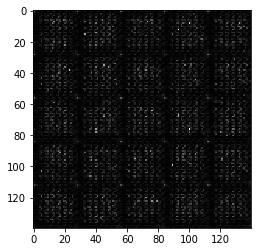

Epoch 1/2... Steps 700 Discriminator Loss: 1.5426... Generator Loss: 0.3691


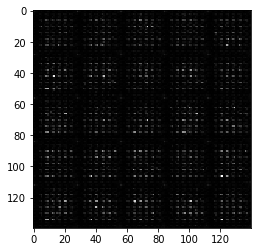

Epoch 1/2... Steps 750 Discriminator Loss: 1.5059... Generator Loss: 0.4017


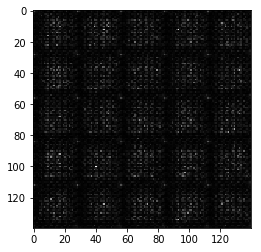

Epoch 1/2... Steps 800 Discriminator Loss: 1.5094... Generator Loss: 0.3984


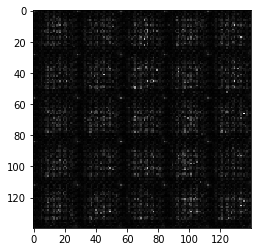

Epoch 1/2... Steps 850 Discriminator Loss: 1.5029... Generator Loss: 0.4048


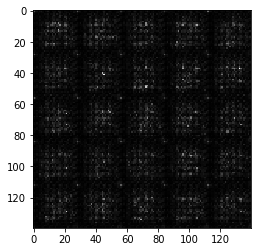

Epoch 1/2... Steps 900 Discriminator Loss: 1.4990... Generator Loss: 0.4093


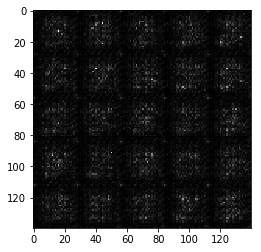

Epoch 1/2... Steps 950 Discriminator Loss: 1.5047... Generator Loss: 0.4038


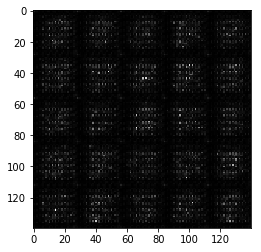

Epoch 1/2... Steps 1000 Discriminator Loss: 1.5052... Generator Loss: 0.4026


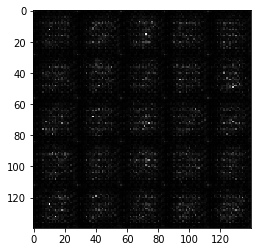

Epoch 1/2... Steps 1050 Discriminator Loss: 1.4936... Generator Loss: 0.4154


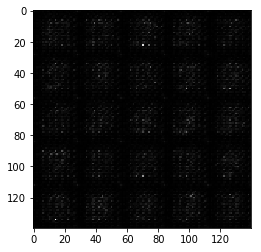

Epoch 1/2... Steps 1100 Discriminator Loss: 1.4949... Generator Loss: 0.4140


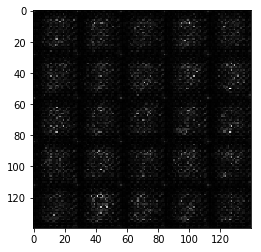

Epoch 1/2... Steps 1150 Discriminator Loss: 1.4838... Generator Loss: 0.4256


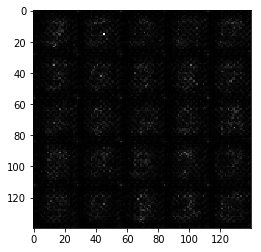

Epoch 1/2... Steps 1200 Discriminator Loss: 1.4901... Generator Loss: 0.4189


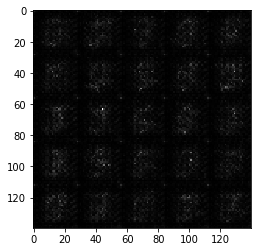

Epoch 1/2... Steps 1250 Discriminator Loss: 1.4847... Generator Loss: 0.4251


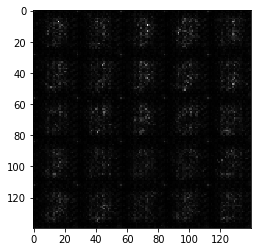

Epoch 1/2... Steps 1300 Discriminator Loss: 1.4842... Generator Loss: 0.4261


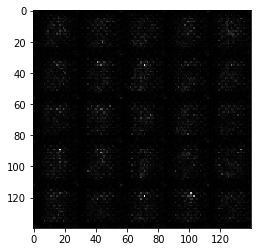

Epoch 1/2... Steps 1350 Discriminator Loss: 1.4762... Generator Loss: 0.4354


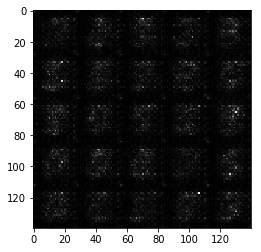

Epoch 1/2... Steps 1400 Discriminator Loss: 1.4837... Generator Loss: 0.4267


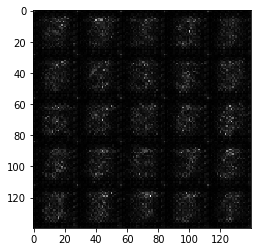

Epoch 1/2... Steps 1450 Discriminator Loss: 1.4757... Generator Loss: 0.4360


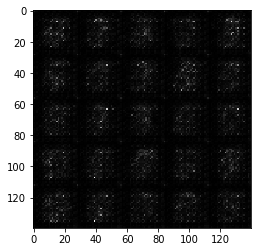

Epoch 1/2... Steps 1500 Discriminator Loss: 1.4770... Generator Loss: 0.4347


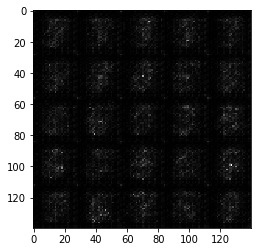

Epoch 1/2... Steps 1550 Discriminator Loss: 1.4895... Generator Loss: 0.4207


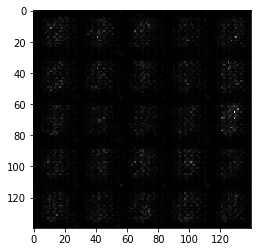

Epoch 1/2... Steps 1600 Discriminator Loss: 1.4843... Generator Loss: 0.4263


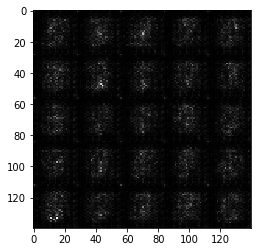

Epoch 1/2... Steps 1650 Discriminator Loss: 1.4705... Generator Loss: 0.4428


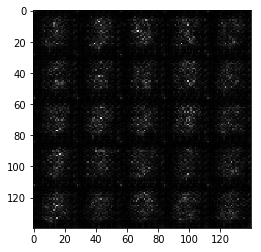

Epoch 1/2... Steps 1700 Discriminator Loss: 1.6248... Generator Loss: 0.3142


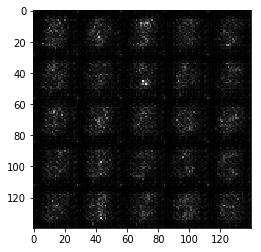

Epoch 1/2... Steps 1750 Discriminator Loss: 1.4477... Generator Loss: 0.4744


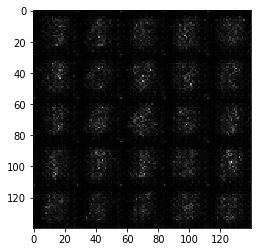

Epoch 1/2... Steps 1800 Discriminator Loss: 1.4396... Generator Loss: 0.4874


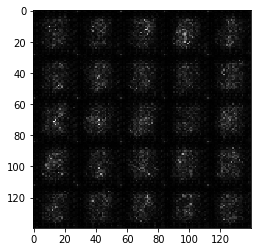

Epoch 1/2... Steps 1850 Discriminator Loss: 1.4451... Generator Loss: 0.4783


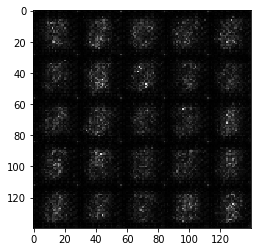

Epoch 2/2... Steps 1900 Discriminator Loss: 1.4541... Generator Loss: 0.4647


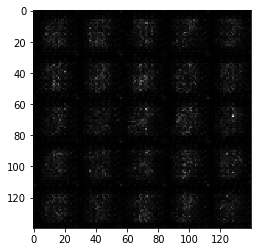

In [ ]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.2


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/2... Steps 50 Discriminator Loss: 0.6581... Generator Loss: 1.7730


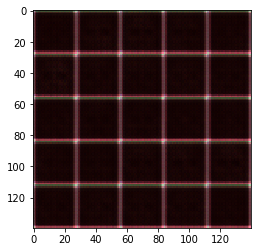

Epoch 1/2... Steps 100 Discriminator Loss: 3.5267... Generator Loss: 13.0645


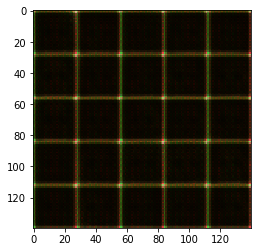

Epoch 1/2... Steps 150 Discriminator Loss: 0.4789... Generator Loss: 1.5431


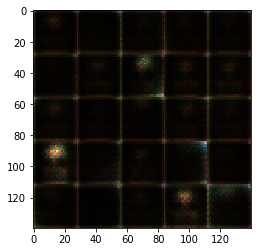

Epoch 1/2... Steps 200 Discriminator Loss: 1.1490... Generator Loss: 0.8130


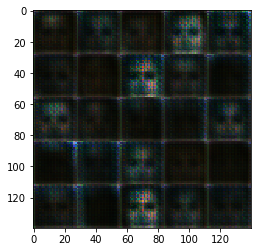

Epoch 1/2... Steps 250 Discriminator Loss: 0.7369... Generator Loss: 3.1840


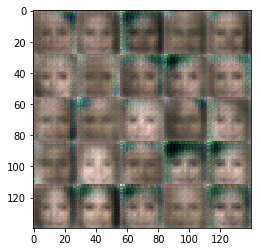

Epoch 1/2... Steps 300 Discriminator Loss: 1.6070... Generator Loss: 5.6940


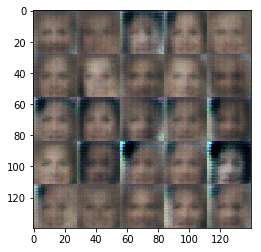

Epoch 1/2... Steps 350 Discriminator Loss: 0.4613... Generator Loss: 2.4856


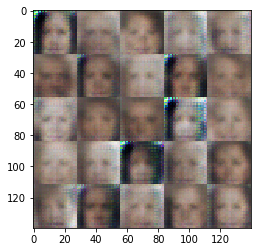

Epoch 1/2... Steps 400 Discriminator Loss: 0.1672... Generator Loss: 2.8775


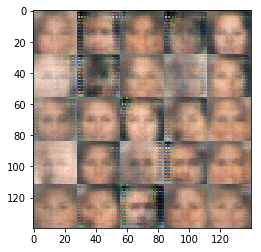

Epoch 1/2... Steps 450 Discriminator Loss: 0.1790... Generator Loss: 7.2889


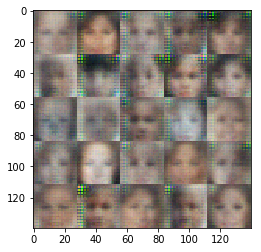

Epoch 1/2... Steps 500 Discriminator Loss: 1.1588... Generator Loss: 2.5083


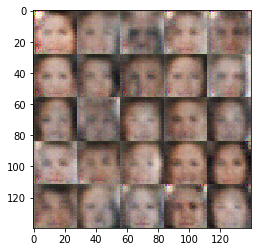

Epoch 1/2... Steps 550 Discriminator Loss: 1.0697... Generator Loss: 0.4985


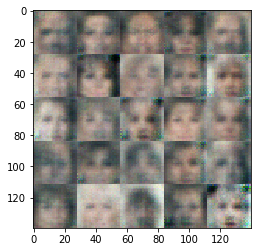

Epoch 1/2... Steps 600 Discriminator Loss: 0.9565... Generator Loss: 2.6011


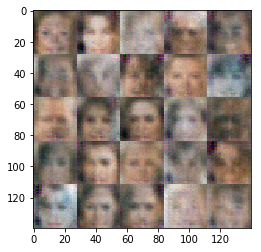

Epoch 1/2... Steps 650 Discriminator Loss: 0.8481... Generator Loss: 2.8228


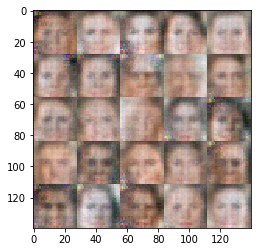

Epoch 1/2... Steps 700 Discriminator Loss: 1.0409... Generator Loss: 0.6993


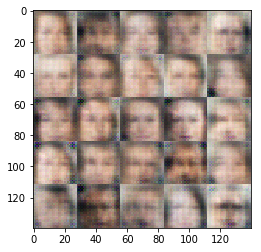

Epoch 1/2... Steps 750 Discriminator Loss: 0.3123... Generator Loss: 1.7723


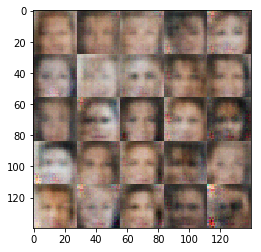

Epoch 1/2... Steps 800 Discriminator Loss: 0.8225... Generator Loss: 1.0180


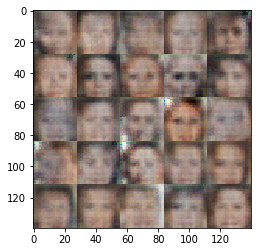

Epoch 1/2... Steps 850 Discriminator Loss: 0.0367... Generator Loss: 7.0110


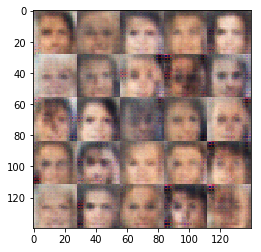

Epoch 1/2... Steps 900 Discriminator Loss: 1.3869... Generator Loss: 0.7649


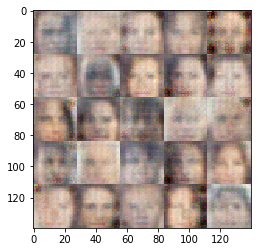

Epoch 1/2... Steps 950 Discriminator Loss: 1.1873... Generator Loss: 0.9982


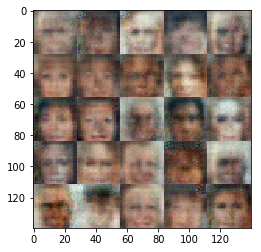

Epoch 1/2... Steps 1000 Discriminator Loss: 1.3057... Generator Loss: 0.8369


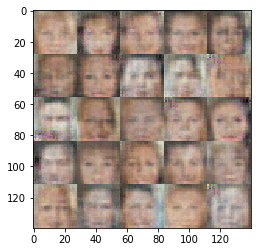

Epoch 1/2... Steps 1050 Discriminator Loss: 2.0596... Generator Loss: 0.2666


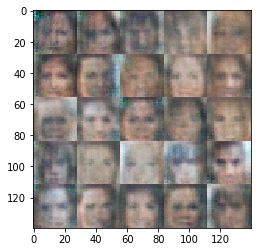

Epoch 1/2... Steps 1100 Discriminator Loss: 0.4515... Generator Loss: 1.8155


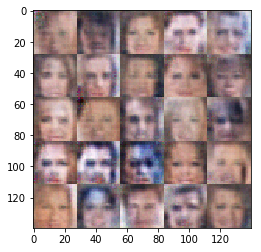

Epoch 1/2... Steps 1150 Discriminator Loss: 1.7113... Generator Loss: 0.2910


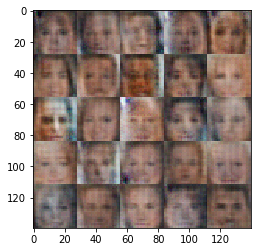

Epoch 1/2... Steps 1200 Discriminator Loss: 2.1173... Generator Loss: 0.7369


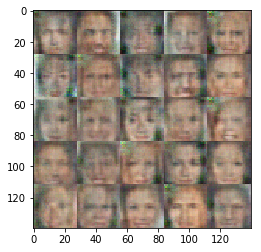

Epoch 1/2... Steps 1250 Discriminator Loss: 1.1391... Generator Loss: 0.6528


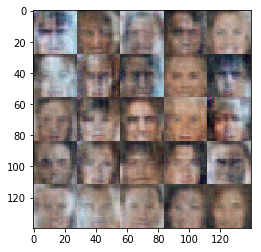

Epoch 1/2... Steps 1300 Discriminator Loss: 1.9824... Generator Loss: 0.1929


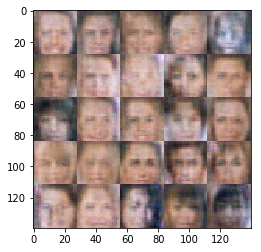

Epoch 1/2... Steps 1350 Discriminator Loss: 0.5797... Generator Loss: 1.7968


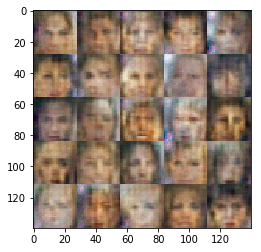

Epoch 1/2... Steps 1400 Discriminator Loss: 1.2117... Generator Loss: 0.7953


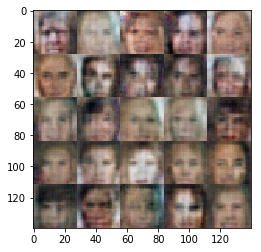

Epoch 1/2... Steps 1450 Discriminator Loss: 1.1449... Generator Loss: 1.1701


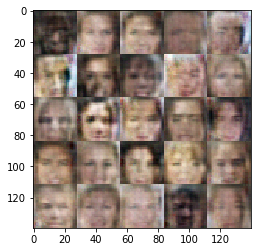

Epoch 1/2... Steps 1500 Discriminator Loss: 1.2369... Generator Loss: 0.7993


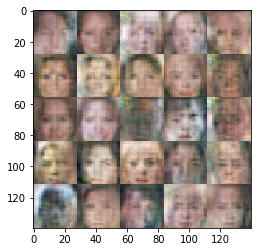

Epoch 1/2... Steps 1550 Discriminator Loss: 1.2813... Generator Loss: 0.7637


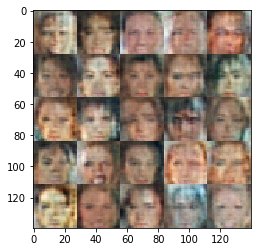

Epoch 1/2... Steps 1600 Discriminator Loss: 1.3323... Generator Loss: 1.4882


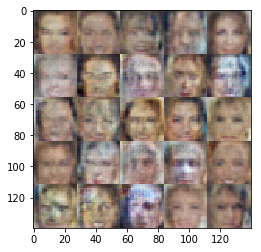

Epoch 1/2... Steps 1650 Discriminator Loss: 1.0251... Generator Loss: 1.2306


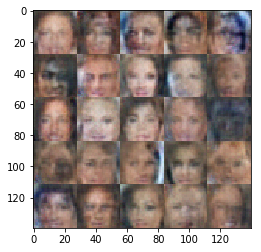

Epoch 1/2... Steps 1700 Discriminator Loss: 1.2061... Generator Loss: 0.8960


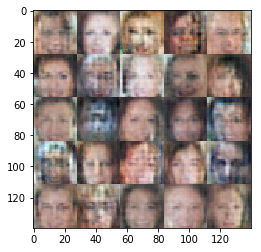

Epoch 1/2... Steps 1750 Discriminator Loss: 0.9752... Generator Loss: 0.7112


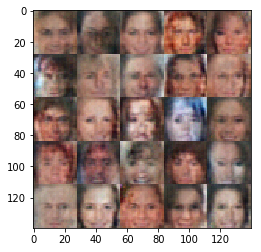

Epoch 1/2... Steps 1800 Discriminator Loss: 1.3427... Generator Loss: 0.6582


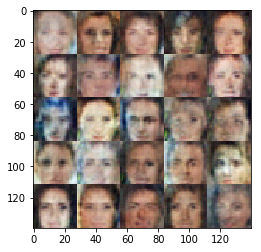

Epoch 1/2... Steps 1850 Discriminator Loss: 1.6000... Generator Loss: 0.3381


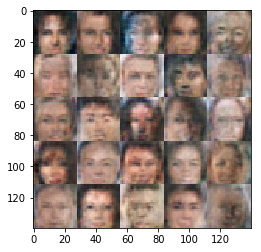

Epoch 1/2... Steps 1900 Discriminator Loss: 1.3758... Generator Loss: 0.4315


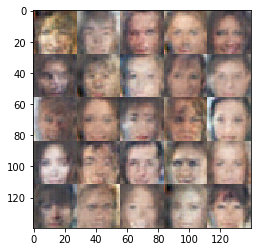

Epoch 1/2... Steps 1950 Discriminator Loss: 1.3523... Generator Loss: 0.5038


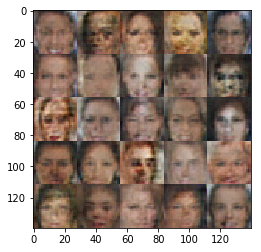

Epoch 1/2... Steps 2000 Discriminator Loss: 1.3885... Generator Loss: 0.4894


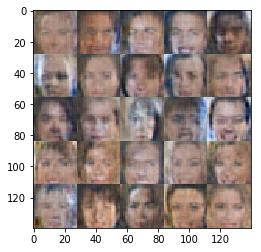

Epoch 1/2... Steps 2050 Discriminator Loss: 1.2818... Generator Loss: 1.7528


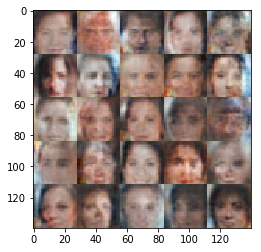

Epoch 1/2... Steps 2100 Discriminator Loss: 1.1957... Generator Loss: 0.5729


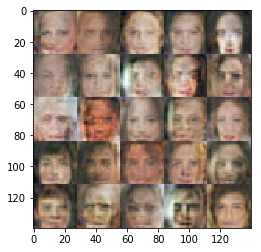

Epoch 1/2... Steps 2150 Discriminator Loss: 1.3661... Generator Loss: 1.6920


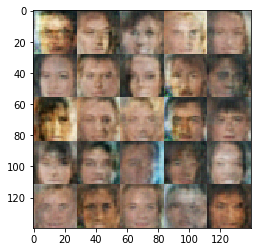

Epoch 1/2... Steps 2200 Discriminator Loss: 1.1042... Generator Loss: 0.8251


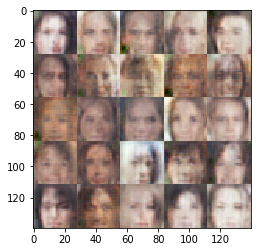

Epoch 1/2... Steps 2250 Discriminator Loss: 0.4318... Generator Loss: 2.0546


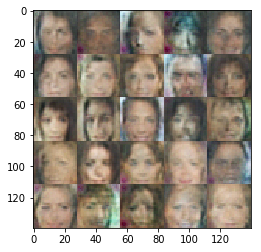

Epoch 1/2... Steps 2300 Discriminator Loss: 0.1999... Generator Loss: 2.9650


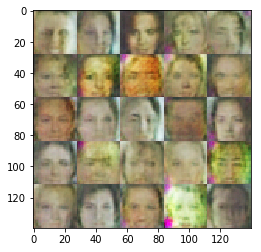

Epoch 1/2... Steps 2350 Discriminator Loss: 1.1777... Generator Loss: 3.0678


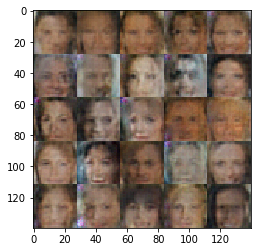

Epoch 1/2... Steps 2400 Discriminator Loss: 0.0422... Generator Loss: 5.1507


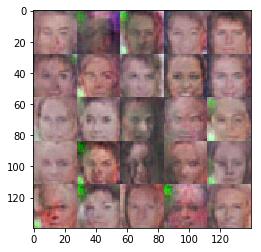

Epoch 1/2... Steps 2450 Discriminator Loss: 2.2568... Generator Loss: 5.0983


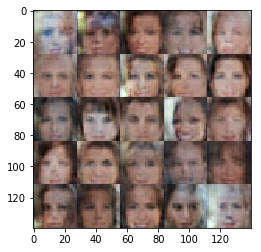

Epoch 1/2... Steps 2500 Discriminator Loss: 0.0113... Generator Loss: 8.4013


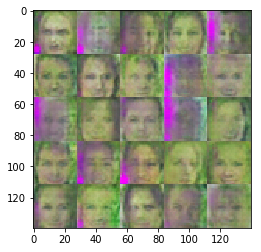

Epoch 1/2... Steps 2550 Discriminator Loss: 1.2323... Generator Loss: 0.7204


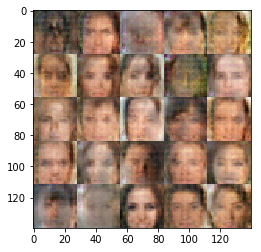

Epoch 1/2... Steps 2600 Discriminator Loss: 1.2236... Generator Loss: 0.9577


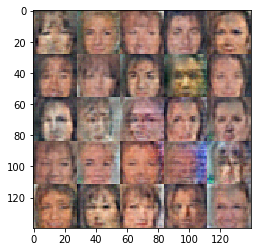

Epoch 1/2... Steps 2650 Discriminator Loss: 1.4947... Generator Loss: 0.4943


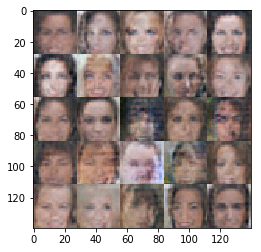

Epoch 1/2... Steps 2700 Discriminator Loss: 1.0538... Generator Loss: 1.7013


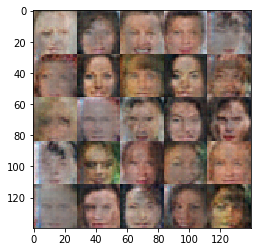

Epoch 1/2... Steps 2750 Discriminator Loss: 1.8188... Generator Loss: 0.2406


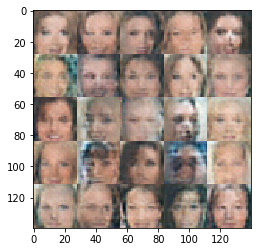

Epoch 1/2... Steps 2800 Discriminator Loss: 1.4794... Generator Loss: 0.5034


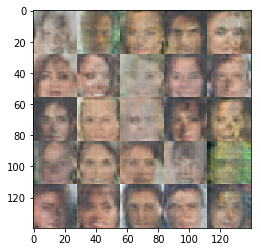

Epoch 1/2... Steps 2850 Discriminator Loss: 1.3642... Generator Loss: 0.5922


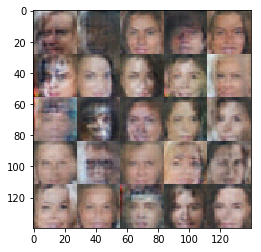

Epoch 1/2... Steps 2900 Discriminator Loss: 1.1525... Generator Loss: 1.5195


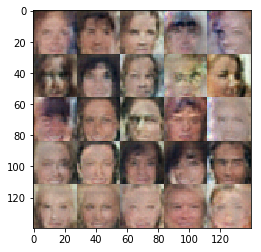

Epoch 1/2... Steps 2950 Discriminator Loss: 2.0093... Generator Loss: 0.2117


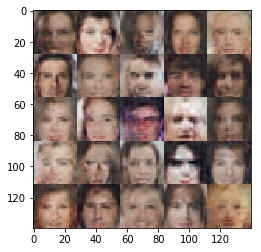

Epoch 1/2... Steps 3000 Discriminator Loss: 1.2761... Generator Loss: 0.5436


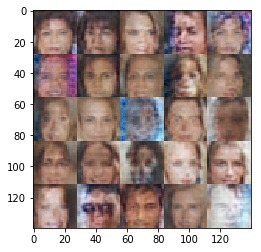

Epoch 1/2... Steps 3050 Discriminator Loss: 1.2891... Generator Loss: 0.5828


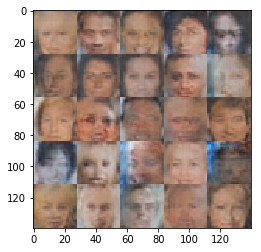

Epoch 1/2... Steps 3100 Discriminator Loss: 1.4519... Generator Loss: 0.5944


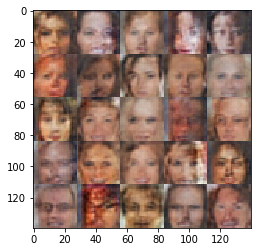

Epoch 1/2... Steps 3150 Discriminator Loss: 1.5287... Generator Loss: 0.3419


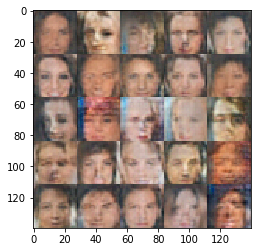

Epoch 2/2... Steps 3200 Discriminator Loss: 0.9566... Generator Loss: 1.3765


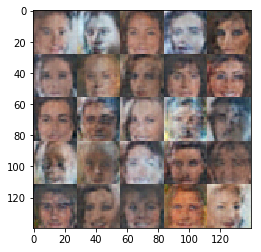

Epoch 2/2... Steps 3250 Discriminator Loss: 1.0759... Generator Loss: 0.9035


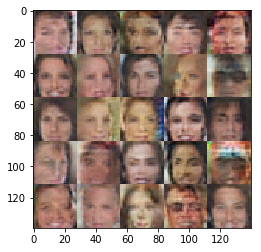

Epoch 2/2... Steps 3300 Discriminator Loss: 1.6566... Generator Loss: 0.3118


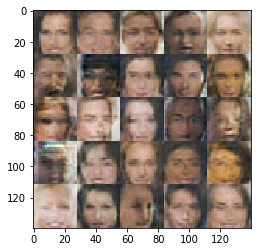

Epoch 2/2... Steps 3350 Discriminator Loss: 0.9365... Generator Loss: 1.0983


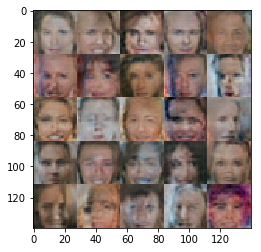

Epoch 2/2... Steps 3400 Discriminator Loss: 1.4495... Generator Loss: 1.3937


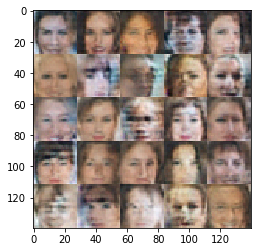

Epoch 2/2... Steps 3450 Discriminator Loss: 0.7449... Generator Loss: 1.6314


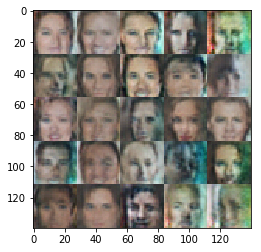

Epoch 2/2... Steps 3500 Discriminator Loss: 0.5364... Generator Loss: 1.6388


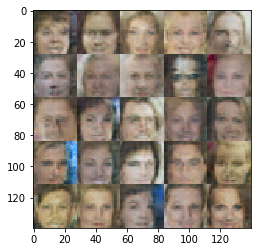

Epoch 2/2... Steps 3550 Discriminator Loss: 0.0978... Generator Loss: 5.3334


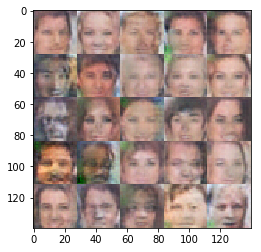

Epoch 2/2... Steps 3600 Discriminator Loss: 0.3913... Generator Loss: 3.1343


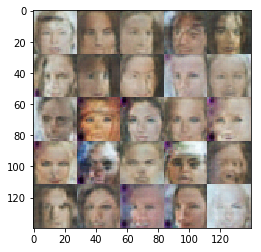

Epoch 2/2... Steps 3650 Discriminator Loss: 0.8896... Generator Loss: 1.3168


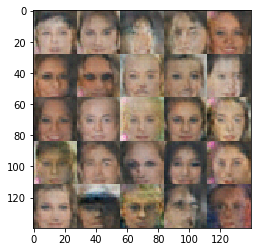

Epoch 2/2... Steps 3700 Discriminator Loss: 0.5063... Generator Loss: 5.4213


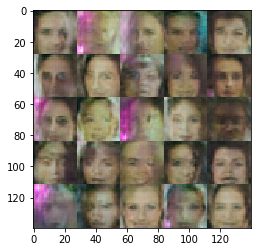

Epoch 2/2... Steps 3750 Discriminator Loss: 3.0244... Generator Loss: 0.0987


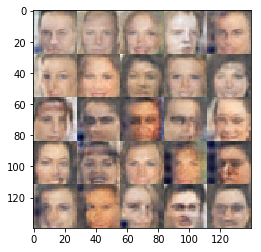

Epoch 2/2... Steps 3800 Discriminator Loss: 1.6453... Generator Loss: 0.3710


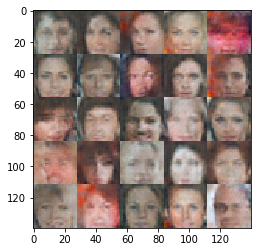

Epoch 2/2... Steps 3850 Discriminator Loss: 0.0821... Generator Loss: 3.7248


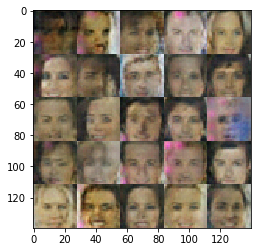

Epoch 2/2... Steps 3900 Discriminator Loss: 0.6344... Generator Loss: 1.0356


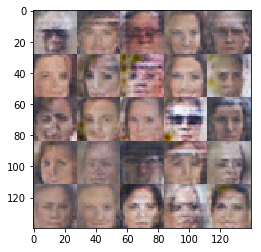

Epoch 2/2... Steps 3950 Discriminator Loss: 0.4720... Generator Loss: 1.6484


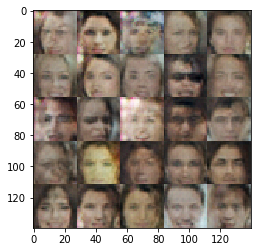

Epoch 2/2... Steps 4000 Discriminator Loss: 2.0665... Generator Loss: 0.2297


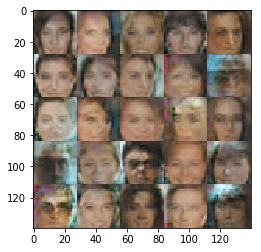

Epoch 2/2... Steps 4050 Discriminator Loss: 0.2348... Generator Loss: 5.2062


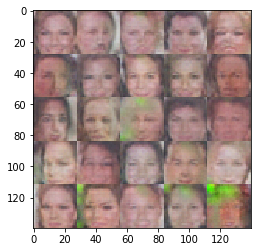

Epoch 2/2... Steps 4100 Discriminator Loss: 1.3253... Generator Loss: 3.6619


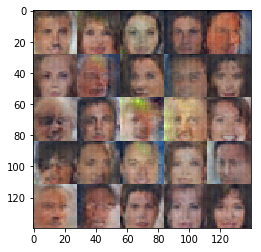

Epoch 2/2... Steps 4150 Discriminator Loss: 0.1094... Generator Loss: 2.7724


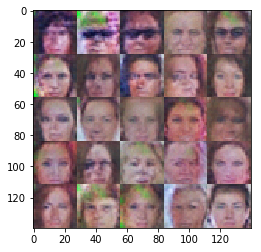

Epoch 2/2... Steps 4200 Discriminator Loss: 0.7399... Generator Loss: 1.8853


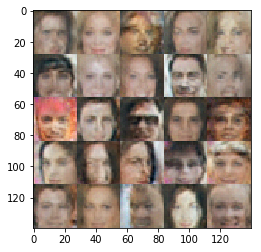

Epoch 2/2... Steps 4250 Discriminator Loss: 1.0671... Generator Loss: 0.6973


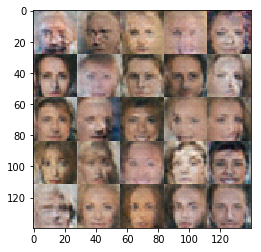

Epoch 2/2... Steps 4300 Discriminator Loss: 0.0105... Generator Loss: 8.6040


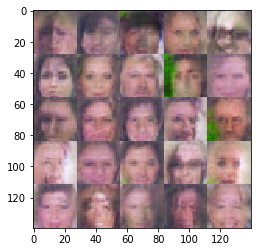

Epoch 2/2... Steps 4350 Discriminator Loss: 0.0851... Generator Loss: 4.0317


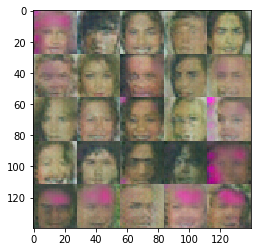

Epoch 2/2... Steps 4400 Discriminator Loss: 0.0302... Generator Loss: 5.2987


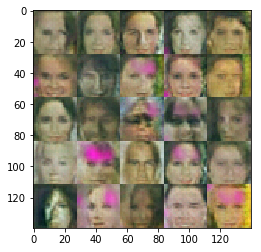

Epoch 2/2... Steps 4450 Discriminator Loss: 0.4622... Generator Loss: 1.9796


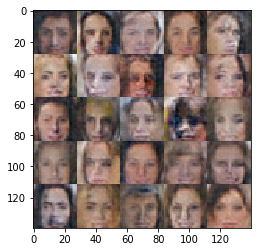

Epoch 2/2... Steps 4500 Discriminator Loss: 0.6164... Generator Loss: 6.4962


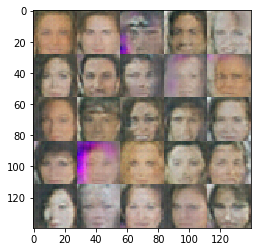

Epoch 2/2... Steps 4550 Discriminator Loss: 0.1221... Generator Loss: 2.7529


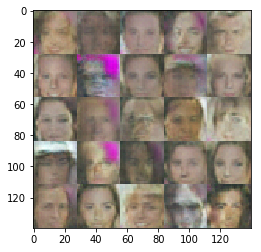

Epoch 2/2... Steps 4600 Discriminator Loss: 1.5809... Generator Loss: 0.8510


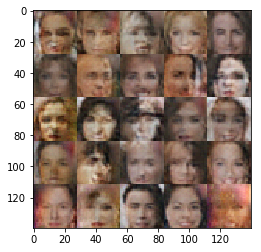

Epoch 2/2... Steps 4650 Discriminator Loss: 1.4119... Generator Loss: 0.9419


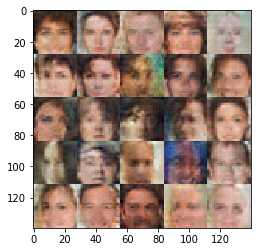

Epoch 2/2... Steps 4700 Discriminator Loss: 0.9652... Generator Loss: 1.1624


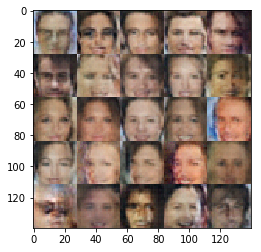

Epoch 2/2... Steps 4750 Discriminator Loss: 1.1919... Generator Loss: 0.9735


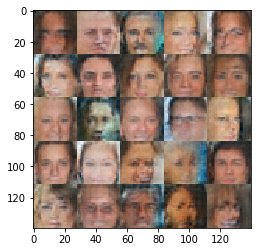

Epoch 2/2... Steps 4800 Discriminator Loss: 1.7572... Generator Loss: 0.3130


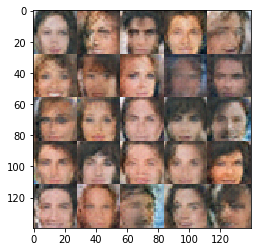

Epoch 2/2... Steps 4850 Discriminator Loss: 1.5141... Generator Loss: 0.5832


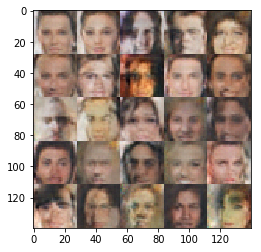

Epoch 2/2... Steps 4900 Discriminator Loss: 1.3083... Generator Loss: 0.9507


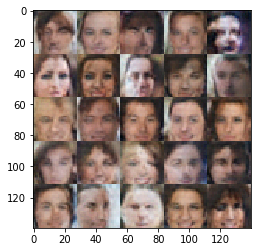

Epoch 2/2... Steps 4950 Discriminator Loss: 1.4721... Generator Loss: 0.4308


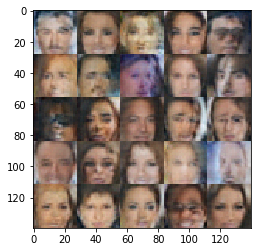

Epoch 2/2... Steps 5000 Discriminator Loss: 1.1678... Generator Loss: 0.9327


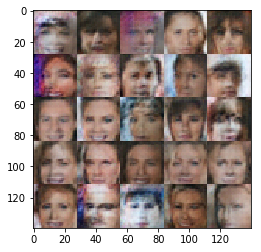

Epoch 2/2... Steps 5050 Discriminator Loss: 1.1004... Generator Loss: 0.8105


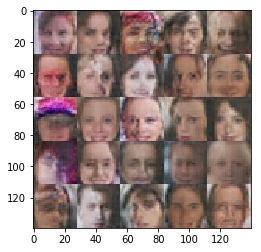

Epoch 2/2... Steps 5100 Discriminator Loss: 1.4724... Generator Loss: 0.4092


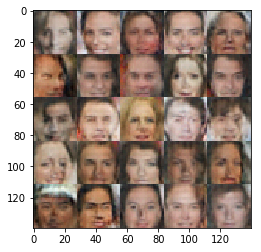

Epoch 2/2... Steps 5150 Discriminator Loss: 0.8880... Generator Loss: 1.1508


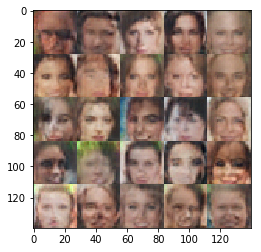

Epoch 2/2... Steps 5200 Discriminator Loss: 0.8051... Generator Loss: 1.3765


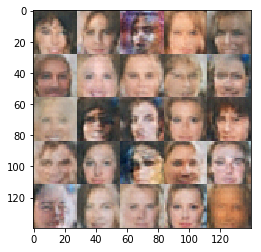

Epoch 2/2... Steps 5250 Discriminator Loss: 0.2124... Generator Loss: 2.4066


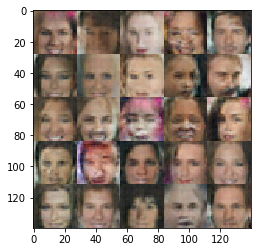

Epoch 2/2... Steps 5300 Discriminator Loss: 0.0398... Generator Loss: 6.1045


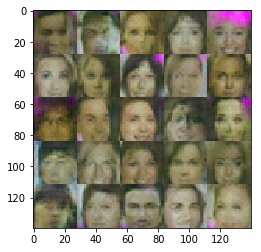

Epoch 2/2... Steps 5350 Discriminator Loss: 0.5137... Generator Loss: 2.2446


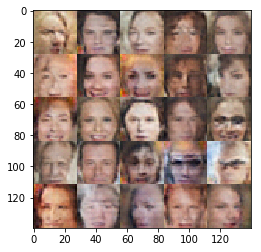

Epoch 2/2... Steps 5400 Discriminator Loss: 1.7521... Generator Loss: 0.4504


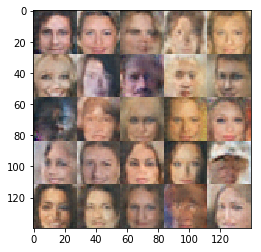

Epoch 2/2... Steps 5450 Discriminator Loss: 1.3080... Generator Loss: 0.6048


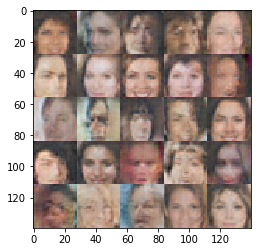

Epoch 2/2... Steps 5500 Discriminator Loss: 1.3975... Generator Loss: 0.6989


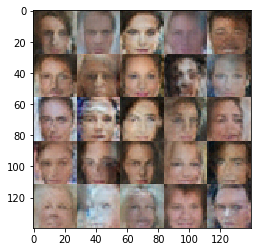

Epoch 2/2... Steps 5550 Discriminator Loss: 1.1515... Generator Loss: 0.8213


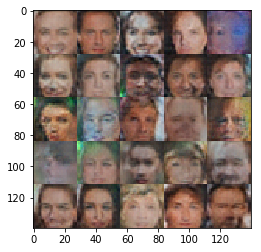

Epoch 2/2... Steps 5600 Discriminator Loss: 2.1861... Generator Loss: 0.1936


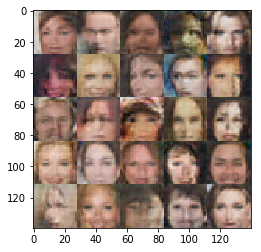

Epoch 2/2... Steps 5650 Discriminator Loss: 1.2835... Generator Loss: 0.8200


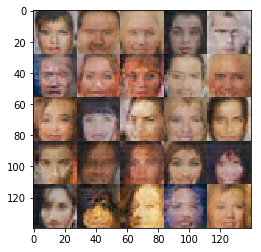

Epoch 2/2... Steps 5700 Discriminator Loss: 0.3128... Generator Loss: 1.9893


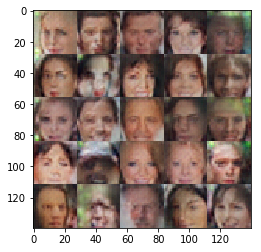

Epoch 2/2... Steps 5750 Discriminator Loss: 0.3590... Generator Loss: 2.5561


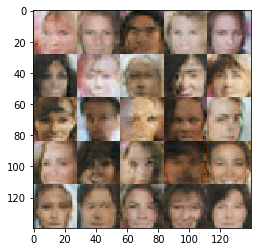

Epoch 2/2... Steps 5800 Discriminator Loss: 0.2296... Generator Loss: 2.6533


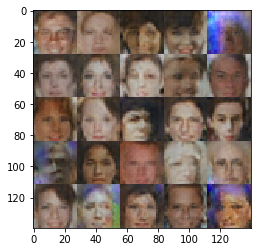

Epoch 2/2... Steps 5850 Discriminator Loss: 0.0858... Generator Loss: 4.5743


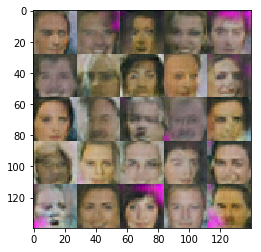

Epoch 2/2... Steps 5900 Discriminator Loss: 0.5939... Generator Loss: 1.4324


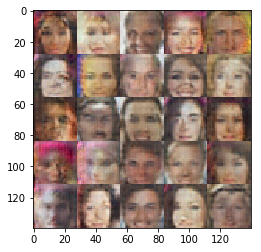

Epoch 2/2... Steps 5950 Discriminator Loss: 0.6919... Generator Loss: 1.3919


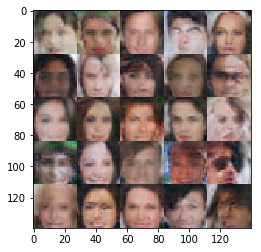

Epoch 2/2... Steps 6000 Discriminator Loss: 1.2076... Generator Loss: 3.5478


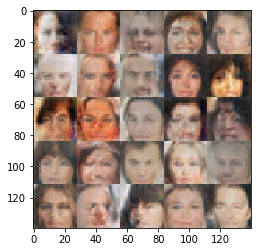

Epoch 2/2... Steps 6050 Discriminator Loss: 1.6800... Generator Loss: 0.3265


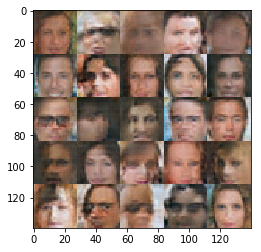

Epoch 2/2... Steps 6100 Discriminator Loss: 1.1779... Generator Loss: 0.7194


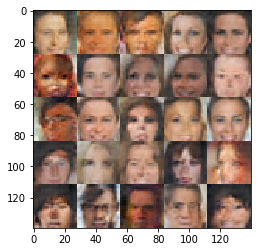

Epoch 2/2... Steps 6150 Discriminator Loss: 1.3817... Generator Loss: 1.0019


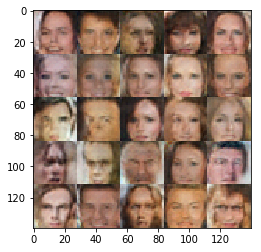

Epoch 2/2... Steps 6200 Discriminator Loss: 1.1331... Generator Loss: 0.8762


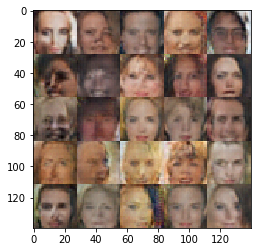

Epoch 2/2... Steps 6250 Discriminator Loss: 1.3795... Generator Loss: 0.5737


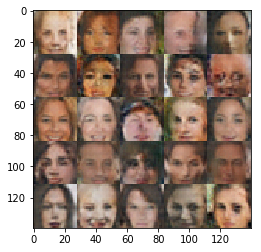

Epoch 2/2... Steps 6300 Discriminator Loss: 1.1536... Generator Loss: 0.7739


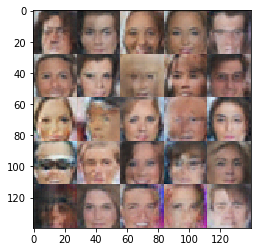

In [13]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.2


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.